# Notebook for clustering the envelope signal

In [135]:
from scipy.stats import kurtosis, skew
from scipy import signal
from numpy import load
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from scipy.signal import find_peaks
import matplotlib.pyplot as plt
import sys, os

ROOT_PATH = os.path.abspath("..").split("data_processing")[0]
print("ROOT", ROOT_PATH)
module_path = os.path.abspath(os.path.join(ROOT_PATH+"/utils/"))
if module_path not in sys.path:
    print("appended")
    sys.path.append(module_path)

import functions as f

module_path = os.path.abspath(os.path.join(ROOT_PATH+"/data_processing/"))
if module_path not in sys.path:
    print("appended")
    sys.path.append(module_path)
    
import wt_data

import ff_transform
import envelope
import explore_fft_time_data

ROOT /Users/stianismar/Dropbox/gitProsjekter/master-thesis/src


# Applying to WT data (WT4)

## Time domain features
Ref "Online automatic diagnosis ...." paper: 

1. RMS
2. Kurtosis 
3. Skewness 
4. Peak to peak
5. Crest factor 
6. Shape factor 
7. Impulse factor 
8. Margin factor 
9. Mean 
10. STD 
11. Enery 
12. Energy entropy

In [136]:
fs = 25600.097656622533

def get_time_domain_features(sig,fs):
    # rms
    r = sum(map(lambda x: x**2,sig))
    rms = np.sqrt(2*r)

    # kurt
    kurt = kurtosis(sig)

    # skewness
    skewness = skew(sig)

    # signal energy
    signal_energy = signal.welch(sig,fs)
    energy_mean = np.mean(signal_energy)

    # normal mean
    signal_mean = np.mean(sig)
    
    return rms, kurt, skewness, energy_mean, signal_mean

In [137]:
# Remove high indexes that only occur once in a while

def get_peaks(sig):
    indices = [i for i,elem in enumerate(sig) if (elem > 4) ]
    # indices = find_peaks(sig, threshold)[0]
    return indices

def remove_indexes(sig):
    indexes = get_peaks(sig)
    filtered = sig.tolist()
    indexes.reverse()
    for i,val in enumerate(indexes):
        del filtered[val]
        
    print(f"Removed {len(indexes)} points")
    return filtered

In [ ]:
filt = []
for vib in (wt04_all_sig):
    filt.append(remove_indexes(vib))
    break

In [ ]:
plt.plot(filt[0][0:10000])

## Load enveloped signal

In [141]:
wt04_all_sig = load('../../sensor_data/all_enveloped_wt04.npz')
wt04_all_sig = wt04_all_sig['arr_0']

### Studying a shorter (time) signal than the original

In [483]:
short_vib = []
for vibs in wt04_all_sig:
    short_vib.append(vibs[100000:101000])

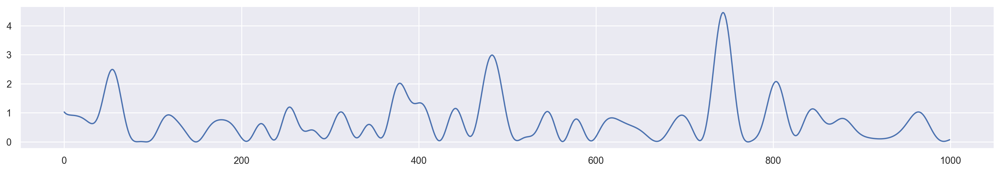

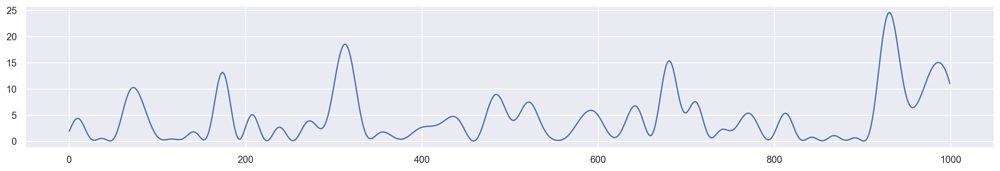

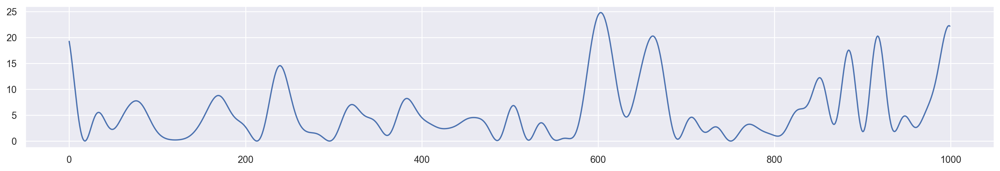

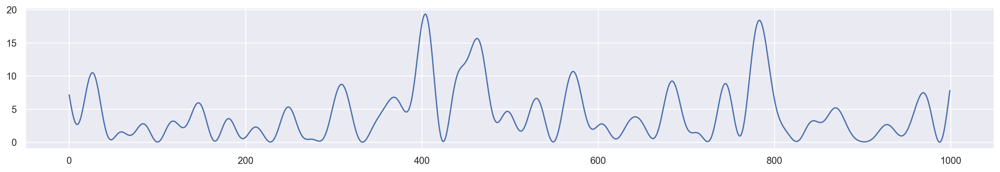

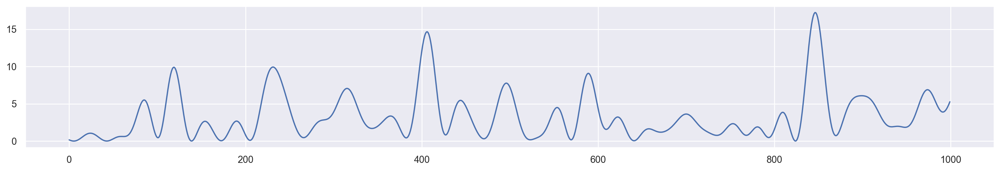

...

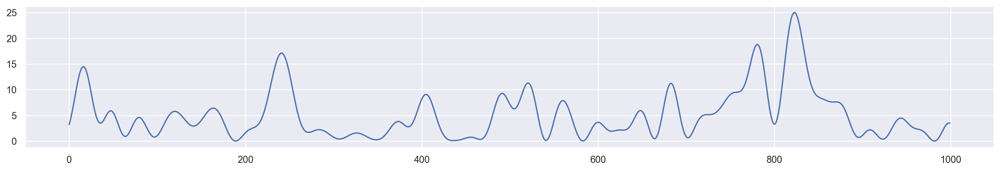

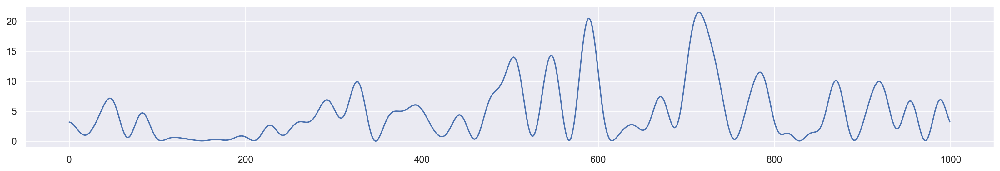

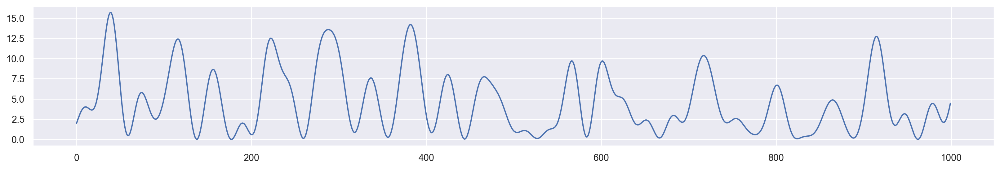

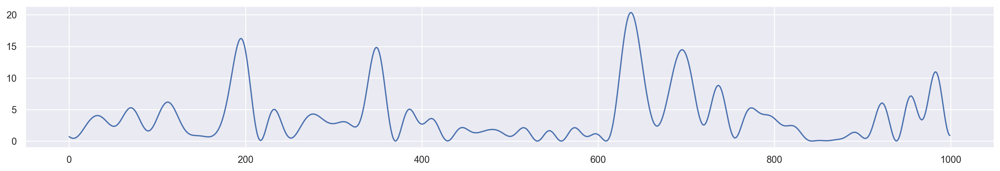

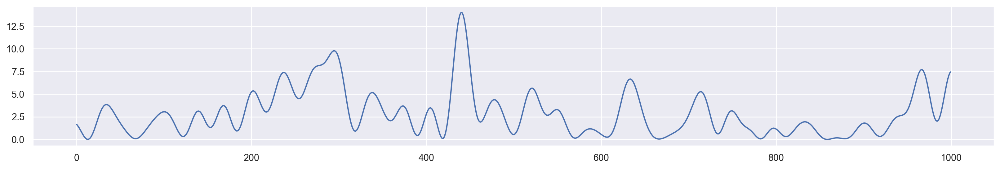

In [540]:
(np.array(short_vib).shape)
for i, ar in enumerate(short_vib):
    fig = plt.figure(figsize=(20,3))
    plt.plot(ar)
    plt.show()
    if i > 10:
        break

In [490]:
df_short = build_time_df(short_vib)

In [491]:
df_short

,rms,kurt,skewness,energy_mean,signal_mean,AvgPower,ActPower,WindSpeed,NacelleDirection,AvgSpeed
0,46.241713,6.410907,2.230848,3200.012231,0.729134,487.811127,387.100006,5.7,236.699997,1000.724591
1,293.008774,3.014010,1.723544,3200.012678,4.484110,2697.461426,2332.100098,9.1,256.100006,1456.464986
2,350.246830,1.916681,1.560895,3200.013181,5.652073,2606.151855,2843.500000,10.0,240.199997,1468.503663
3,257.530519,2.509094,1.612167,3200.012817,4.167867,2541.849854,2694.100098,10.5,71.099998,1458.875183
4,203.574893,3.692797,1.769360,3200.012541,3.310513,2853.304199,3293.399902,12.7,269.399994,1460.635409
...,...,...,...,...,...,...,...,...,...,...
419,184.830000,4.149585,1.961707,3200.012540,2.863896,2565.862793,1585.199951,7.7,358.799988,1420.395518
420,220.476555,4.327506,1.720213,3200.012450,3.923741,2891.829346,2819.300049,10.4,318.600006,1487.214505
421,261.765515,2.560170,1.600756,3200.012693,4.164803,2581.525879,3160.600098,10.2,317.000000,1489.520070
422,18.435330,4.996845,1.945791,3200.012210,0.308756,459.051758,401.200012,5.4,267.000000,887.233392


In [142]:
fs = 25600.097656622533

def build_time_df(all_vibrations):
    data = []
    for j, sig in enumerate(all_vibrations):
        signal_data = []
        rms, kurt, skewness, energy_mean, signal_mean=get_time_domain_features(sig,fs)
        signal_data.append(rms)
        signal_data.append(kurt)
        signal_data.append(skewness)
        signal_data.append(energy_mean)
        signal_data.append(signal_mean)
        signal_data.append(df_intervals_data_wt04['AvgPower'].iloc[j])
        signal_data.append(df_intervals_data_wt04['ActPower'].iloc[j])
        signal_data.append(df_intervals_data_wt04['WindSpeed'].iloc[j])
        signal_data.append(df_intervals_data_wt04['NacelleDirection'].iloc[j])
        signal_data.append(df_intervals_data_wt04['AvgSpeed'].iloc[j])

        data.append(signal_data)

    df = pd.DataFrame(data, columns=[
        'rms', 
        'kurt', 
        'skewness', 
        'energy_mean', 
        'signal_mean',
        'AvgPower',
        'ActPower',
        'WindSpeed',
        'NacelleDirection',
        'AvgSpeed']
                     )
    return df

## Plotting the first interval

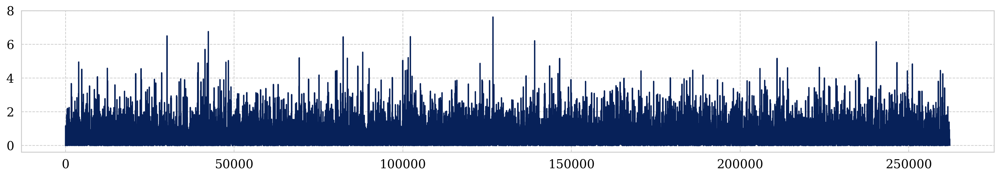

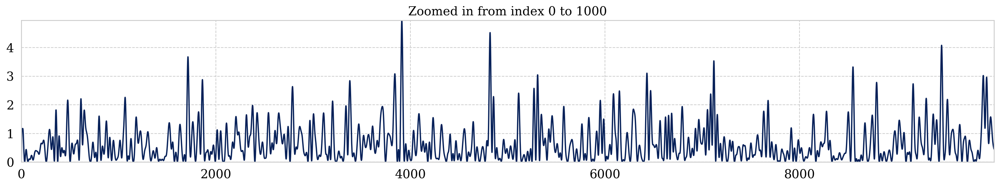

In [143]:
fig = plt.figure(figsize=(20,3))
plt.plot((wt04_all_sig[0]))
plt.show()

fig = plt.figure(figsize=(20,3))
plt.plot(wt04_all_sig[0][0:10000])
plt.title("Zoomed in from index 0 to 1000")
plt.margins(0)
plt.show()

## Load operational data for the intervals

In [144]:
import pandas as pd
df_intervals_data_wt04 = pd.read_csv('../../sensor_data/df_intervals_data_wt04.csv.gz', compression='gzip')
(df_intervals_data_wt04.head())
df_intervals_data_wt04.shape

(424, 6)

## Building dataframe


In [145]:
fs = 25600.097656622533

df = build_time_df(wt04_all_sig)
df

,rms,kurt,skewness,energy_mean,signal_mean,AvgPower,ActPower,WindSpeed,NacelleDirection,AvgSpeed
0,693.322446,6.187482,1.988215,3200.012223,0.682194,487.811127,387.100006,5.7,236.699997,1000.724591
1,4349.243843,6.308812,2.080912,3200.012847,4.162867,2697.461426,2332.100098,9.1,256.100006,1456.464986
2,4855.125348,5.595298,1.988628,3200.013003,4.715489,2606.151855,2843.500000,10.0,240.199997,1468.503663
3,4634.438343,6.186374,2.082814,3200.012930,4.466649,2541.849854,2694.100098,10.5,71.099998,1458.875183
4,4387.911288,6.046927,2.093197,3200.012872,4.183909,2853.304199,3293.399902,12.7,269.399994,1460.635409
...,...,...,...,...,...,...,...,...,...,...
419,3377.541894,4.375476,1.789259,3200.012560,3.349608,2565.862793,1585.199951,7.7,358.799988,1420.395518
420,4332.355482,5.279254,1.903630,3200.012817,4.300772,2891.829346,2819.300049,10.4,318.600006,1487.214505
421,4648.959074,4.572177,1.809813,3200.012867,4.621687,2581.525879,3160.600098,10.2,317.000000,1489.520070
422,321.170802,6.291017,2.070746,3200.012210,0.310700,459.051758,401.200012,5.4,267.000000,887.233392


In [146]:
df

,rms,kurt,skewness,energy_mean,signal_mean,AvgPower,ActPower,WindSpeed,NacelleDirection,AvgSpeed
0,693.322446,6.187482,1.988215,3200.012223,0.682194,487.811127,387.100006,5.7,236.699997,1000.724591
1,4349.243843,6.308812,2.080912,3200.012847,4.162867,2697.461426,2332.100098,9.1,256.100006,1456.464986
2,4855.125348,5.595298,1.988628,3200.013003,4.715489,2606.151855,2843.500000,10.0,240.199997,1468.503663
3,4634.438343,6.186374,2.082814,3200.012930,4.466649,2541.849854,2694.100098,10.5,71.099998,1458.875183
4,4387.911288,6.046927,2.093197,3200.012872,4.183909,2853.304199,3293.399902,12.7,269.399994,1460.635409
...,...,...,...,...,...,...,...,...,...,...
419,3377.541894,4.375476,1.789259,3200.012560,3.349608,2565.862793,1585.199951,7.7,358.799988,1420.395518
420,4332.355482,5.279254,1.903630,3200.012817,4.300772,2891.829346,2819.300049,10.4,318.600006,1487.214505
421,4648.959074,4.572177,1.809813,3200.012867,4.621687,2581.525879,3160.600098,10.2,317.000000,1489.520070
422,321.170802,6.291017,2.070746,3200.012210,0.310700,459.051758,401.200012,5.4,267.000000,887.233392


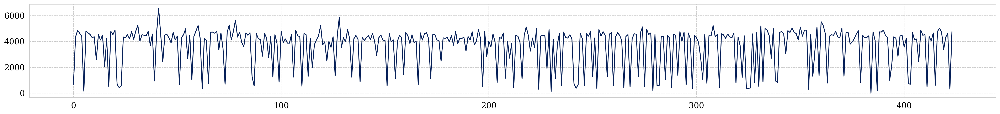

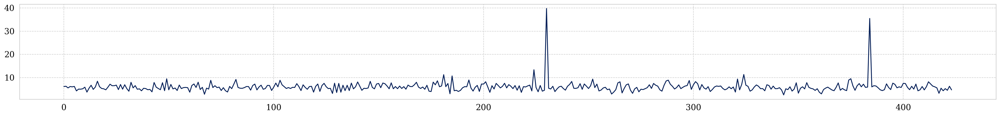

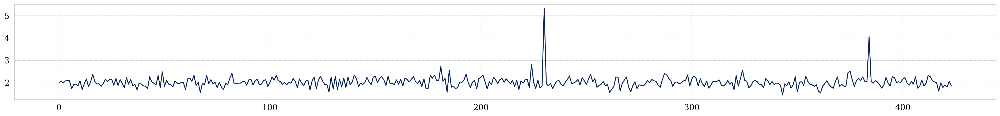

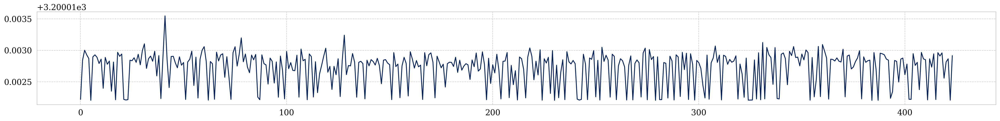

In [438]:
df['rms'].plot(figsize=(30,3))
plt.show()
df['kurt'].plot(figsize=(30,3))
plt.show()
df['skewness'].plot(figsize=(30,3))
plt.show()
df['energy_mean'].plot(figsize=(30,3))
plt.show()

# Plotting the data

In [446]:
def filter_and_plot(df):
    df_filtered = df[df['AvgSpeed'] >= 1300]
    df_filtered = df_filtered[df_filtered['ActPower'] >= 2500]
    df_filtered = df_filtered[df_filtered['WindSpeed'] >= 7]
    df['rms'].plot(figsize=(30,3))
    plt.show()
    df_filtered['kurt'].plot(figsize=(30,3))
    plt.show()
    df_filtered['skewness'].plot(figsize=(30,3))
    plt.show()
    df_filtered['energy_mean'].plot(figsize=(30,3))
    plt.show()
    plt.show()

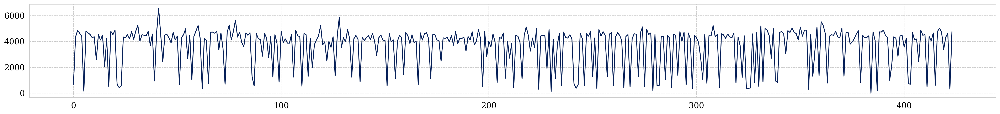

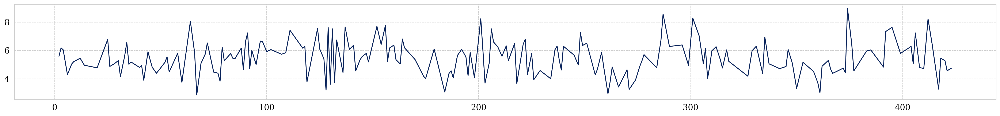

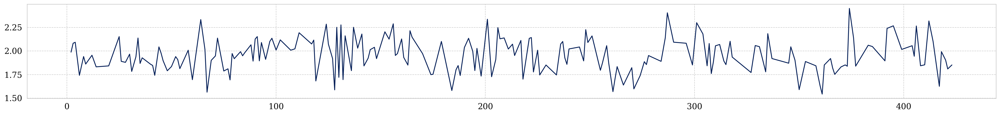

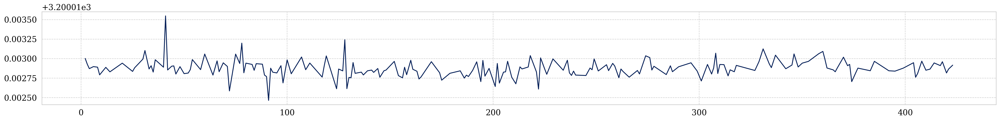

In [447]:
filter_and_plot(df)

Raw signal, without scaling

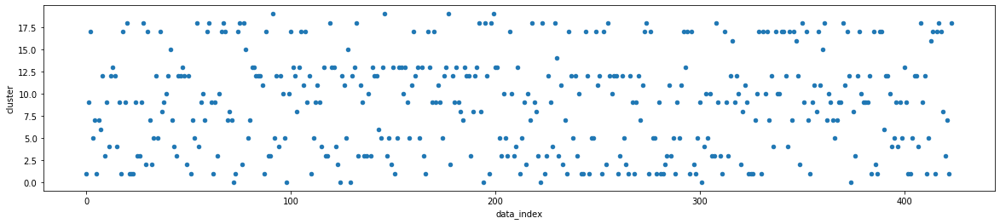

In [166]:
kmeans = KMeans(n_clusters=20, random_state=0).fit(df)
cluster_map = pd.DataFrame()
cluster_map['data_index'] = df.index.values
cluster_map['cluster'] = kmeans.labels_
cluster_map.plot.scatter(y='cluster', x='data_index', figsize=(20,4))
# cluster_map['cluster'].plot.scatter(x=figsize=(30,8))

In [109]:
df.columns
df = df.drop('NacelleDirection', 1)

In [163]:
def scale_df(df):
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(df)
    return scaled

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


(208, 10)


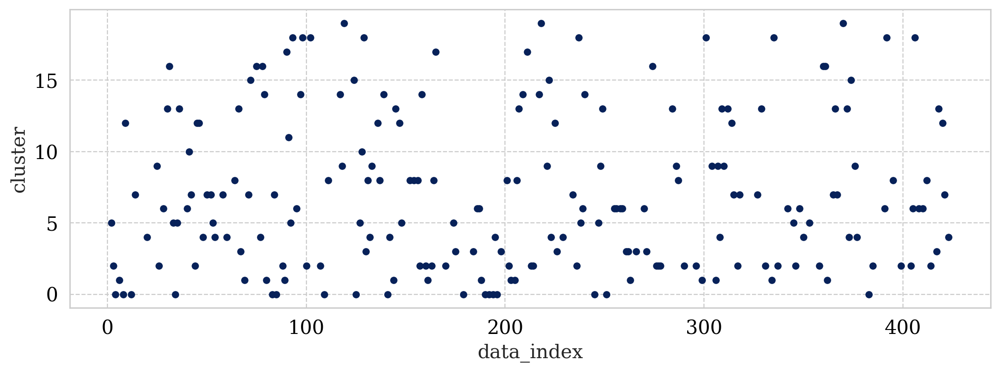

In [457]:
# Filterd on activepower and avgspeed

df_filtered = df[df['AvgSpeed'] >= 1300]
df_filtered = df_filtered[df_filtered['ActPower'] >= 2500]
df_filtered = df_filtered[df_filtered['WindSpeed'] >= 7]

X_train_minmax_filtered=scale_df(df_filtered)
print(X_train_minmax_filtered.shape)

from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=20, random_state=0).fit(X_train_minmax_filtered)
cluster_map = pd.DataFrame()
cluster_map['data_index'] = df_filtered.index.values
cluster_map['cluster'] = kmeans.labels_
cluster_map.plot.scatter(y='cluster', x='data_index')
# cluster_map['cluster'].plot.scatter(x=figsize=(30,8))


In [ ]:
# 1. Look at other (higher) frequeny bands to detect earlier faults
# 2. Vary the size of each frequency band (test with 5000-6000 Hz)
# 3. Find better features in the time domain
# 4. Find better features in the frequency domain
# 5. Try selecting a subset of the features to cluster on (some might not be important)

In [381]:
df_filtered.head()

,rms,kurt,skewness,energy_mean,signal_mean,AvgPower,ActPower,WindSpeed,AvgSpeed
2,4855.125348,5.595298,1.988628,3200.013003,4.715489,2606.151855,2843.500000,10.0,1468.503663
3,4634.438343,6.186374,2.082814,3200.012930,4.466649,2541.849854,2694.100098,10.5,1458.875183
4,4387.911288,6.046927,2.093197,3200.012872,4.183909,2853.304199,3293.399902,12.7,1460.635409
6,4783.622159,4.304706,1.742010,3200.012898,4.813573,2752.077881,3040.300049,9.7,1490.140485
8,4539.350394,5.049681,1.941466,3200.012891,4.404624,3301.744629,3325.800049,14.7,1482.815723


In [391]:
pd.DataFrame(X_train_minmax_filtered).describe()

,0,1,2,3,4,5,6,7,8,9
count,208.000000,208.000000,208.000000,208.000000,208.000000,208.000000,208.000000,208.000000,208.000000,208.000000
mean,0.449262,0.423897,0.455568,0.379579,0.444597,0.744839,0.533327,0.213761,0.565481,0.435588
std,0.108547,0.193293,0.195508,0.105079,0.118435,0.202380,0.318041,0.139971,0.236193,0.125852
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.388837,0.294097,0.329877,0.324552,0.382583,0.573517,0.239016,0.122641,0.373886,0.364100
50%,0.446983,0.406185,0.437762,0.370885,0.448240,0.725685,0.571114,0.169811,0.599367,0.423429
75%,0.498043,0.547489,0.595604,0.436648,0.496389,0.961297,0.851192,0.268868,0.750935,0.493923
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# Clustering with db scan

### Filtered data

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


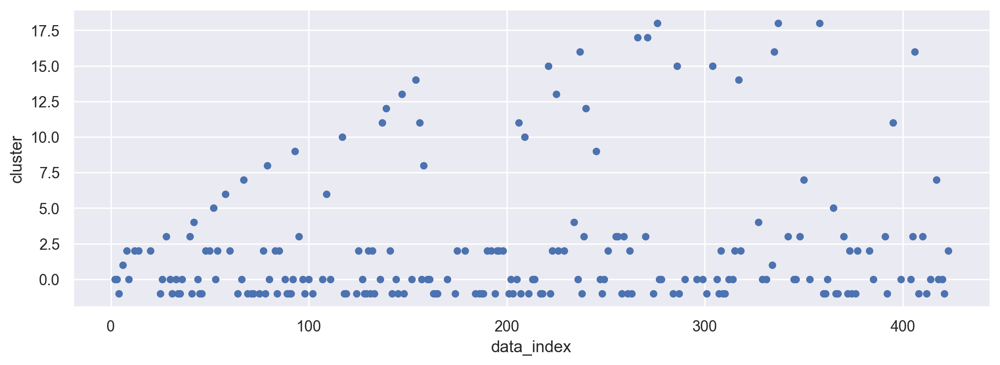

<BarContainer object of 20 artists>

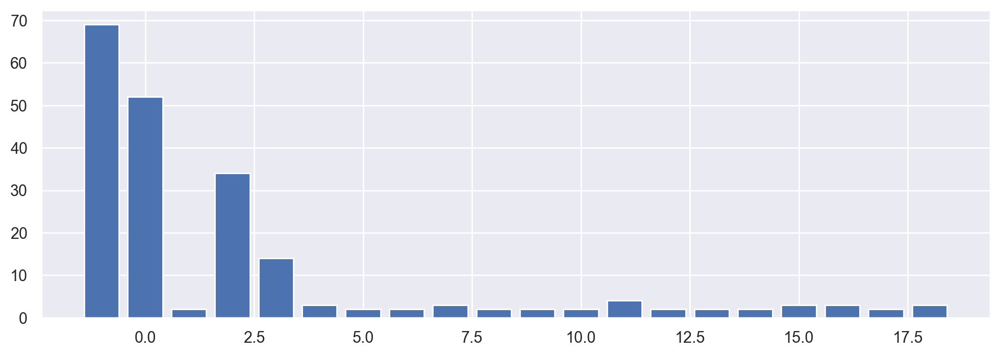

In [537]:
from sklearn.cluster import DBSCAN
import numpy as np
X = X_train_minmax_filtered
clustering = DBSCAN(eps=0.21, min_samples=2).fit(X)
cluster_map = pd.DataFrame()
cluster_map['data_index'] = df_filtered.index.values
cluster_map['cluster'] = clustering.labels_
cluster_map.plot.scatter(y='cluster', x='data_index')
plt.show()
plt.bar(cluster_map['cluster'].value_counts().keys(), cluster_map['cluster'].value_counts().values)

### Unfiltered data

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


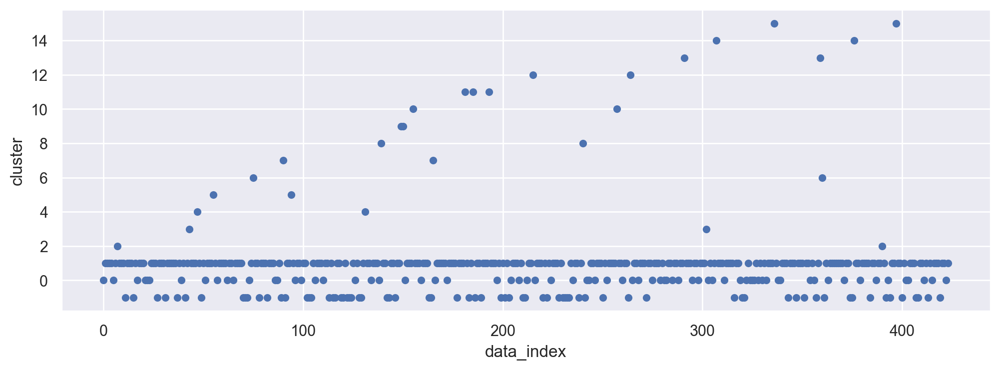

<BarContainer object of 17 artists>

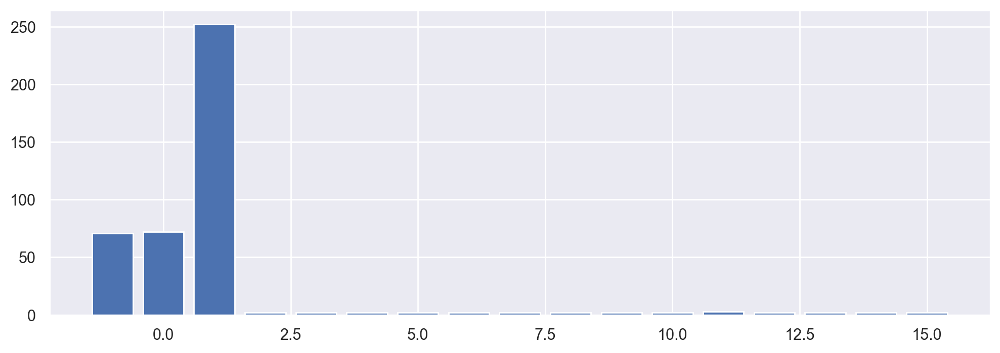

In [536]:
from sklearn.cluster import DBSCAN
import numpy as np

df_scaled = scale_df(df)
X = df_scaled
clustering = DBSCAN(eps=0.11, min_samples=2).fit(X)
cluster_map = pd.DataFrame()
cluster_map['data_index'] = df.index.values
cluster_map['cluster'] = clustering.labels_
cluster_map.plot.scatter(y='cluster', x='data_index')
plt.show()
plt.bar(cluster_map['cluster'].value_counts().keys(), cluster_map['cluster'].value_counts().values)

In [ ]:
df.columns
df = df.drop('NacelleDirection', 1)

## df short

In [166]:
import numpy as np
from sklearn.datasets.samples_generator import make_blobs
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from matplotlib import pyplot as plt
import seaborn as sns

In [165]:
import numpy as np
from sklearn.datasets.samples_generator import make_blobs
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from matplotlib import pyplot as plt
import seaborn as sns

scaled_short = scale_df(df_short)
X = scaled_short


neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X)
distances, indices = nbrs.kneighbors(X)

distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

NameError: name 'df_short' is not defined

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


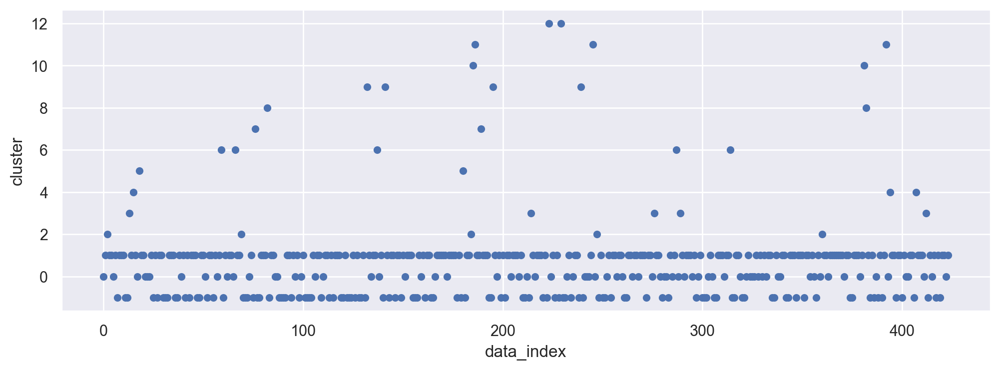

<BarContainer object of 14 artists>

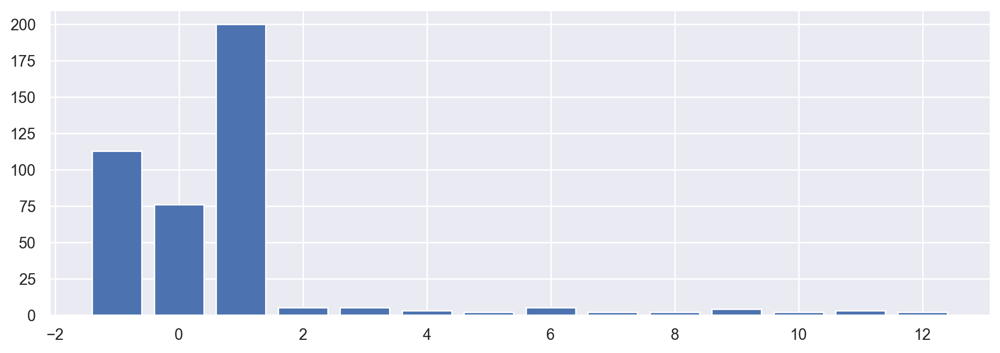

In [535]:

# Cluster it 
# df_short = df_short.drop(['NacelleDirection'],axis=1)

clustering = DBSCAN(eps=0.13, min_samples=2).fit(scaled_short)
cluster_map = pd.DataFrame()
cluster_map['data_index'] = df.index.values
cluster_map['cluster'] = clustering.labels_
cluster_map.plot.scatter(y='cluster', x='data_index')
plt.show()
plt.bar(cluster_map['cluster'].value_counts().keys(), cluster_map['cluster'].value_counts().values)

### 9,5k-10k Hz

In [6]:
vib_9500_10000 = load('../../sensor_data/all_enveloped_wt04_9500_10000.npz')
vib_9500_10000 = vib_9500_10000['arr_0']

In [7]:
print(vib_9500_10000)

[[ 2.73412881e-02  2.42204392e-01  4.36205125e-01 ...  3.90174971e-03
   2.48141269e-03  1.02511516e-03]
 [ 1.19089070e+00  1.25214502e+00  1.30707595e+00 ...  2.01593103e-01
   1.70153685e-01  1.40602064e-01]
 [ 4.11180060e-01  5.96526376e-01  7.55866002e-01 ...  7.56835726e-02
   5.48658736e-02  3.39890957e-02]
 ...
 [ 3.52903292e-02  1.11678694e+00  2.07270192e+00 ...  2.43646466e-02
   1.35202985e-02  2.30789017e-03]
 [ 1.52967224e-02  2.13828839e-02  2.73629071e-02 ...  3.25695374e-04
   2.20642464e-04  1.13287687e-04]
 [-3.68794528e-02  4.70865430e+00  9.00898625e+00 ...  1.66983808e-02
   1.65479049e-02  1.68394509e-02]]


In [8]:
times_wt4 = load('../../sensor_data/intervals_times_wt04.npz')

# Study the FFT signals using Power Spectral Density for a set of frequency bands

In [9]:
times_wt4 = times_wt4['arr_0']

In [65]:
t = times_wt4[0][60000]
t

2.34375

In [10]:
len(vib_9500_10000)

424

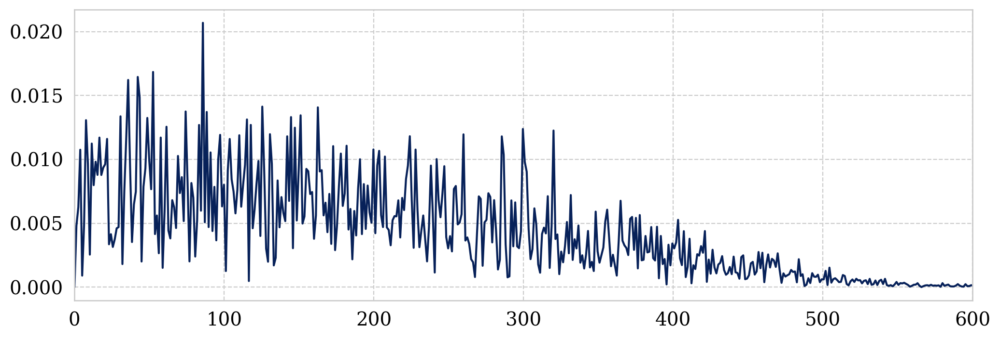

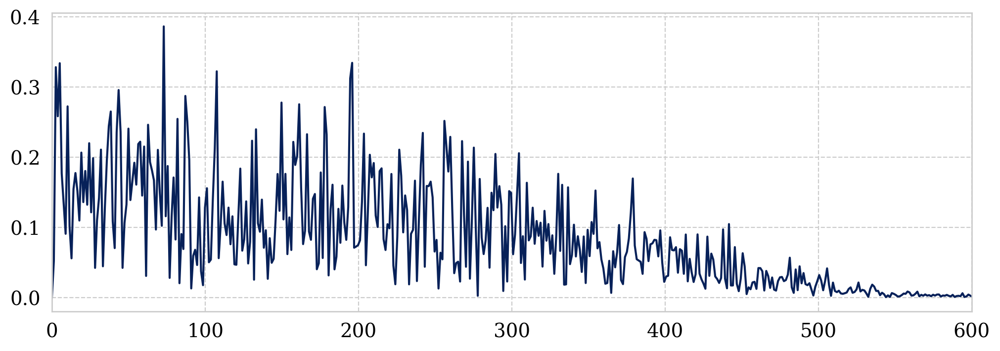

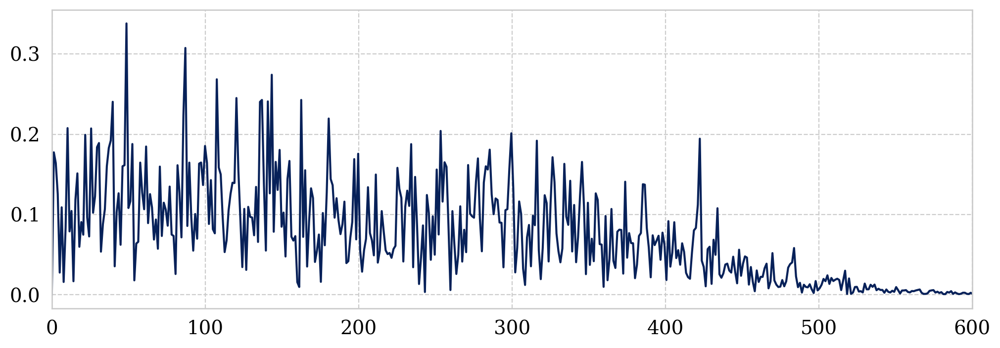

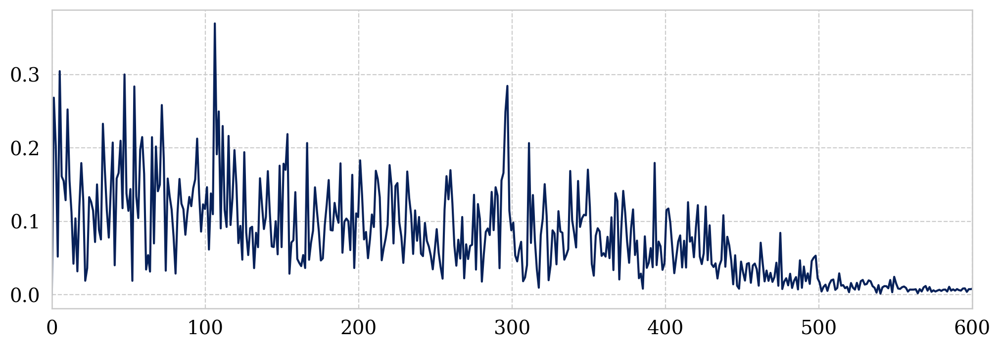

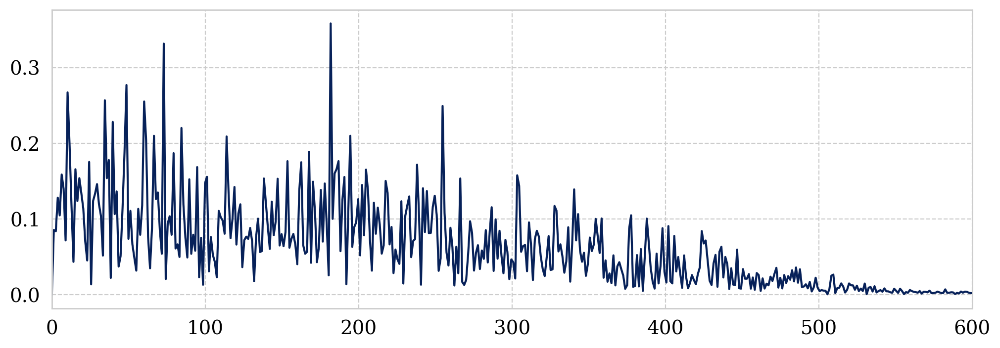

...

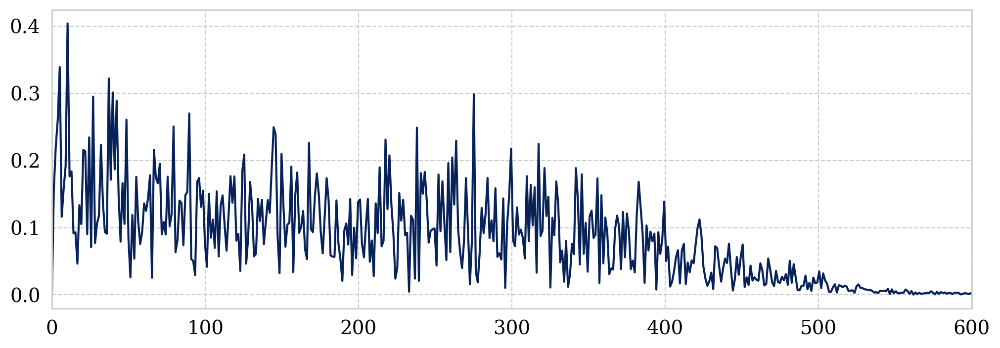

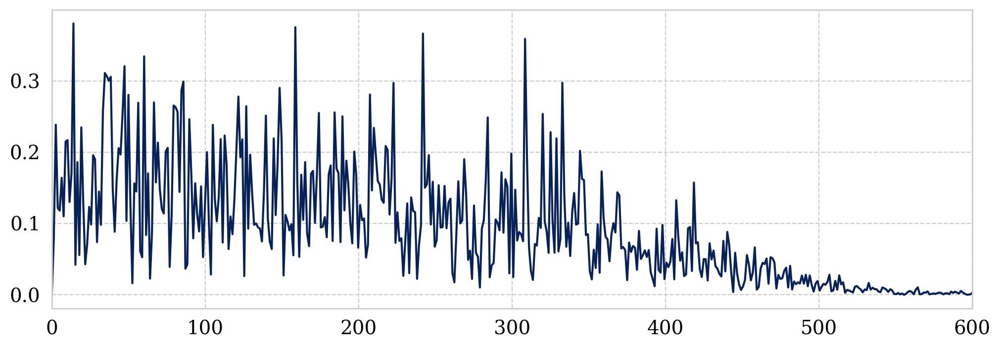

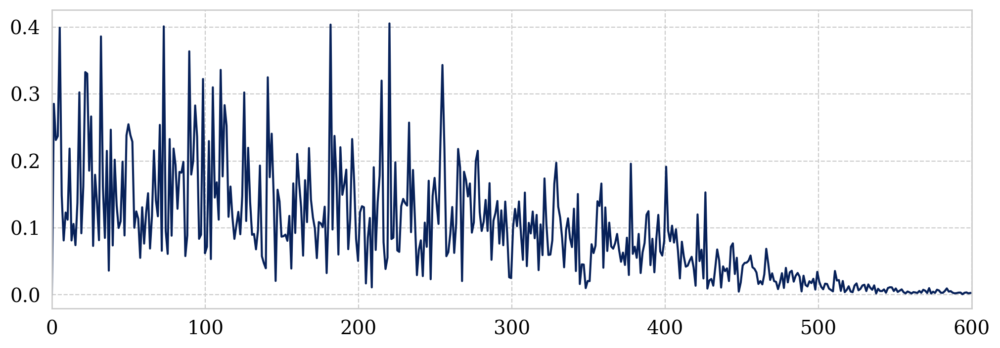

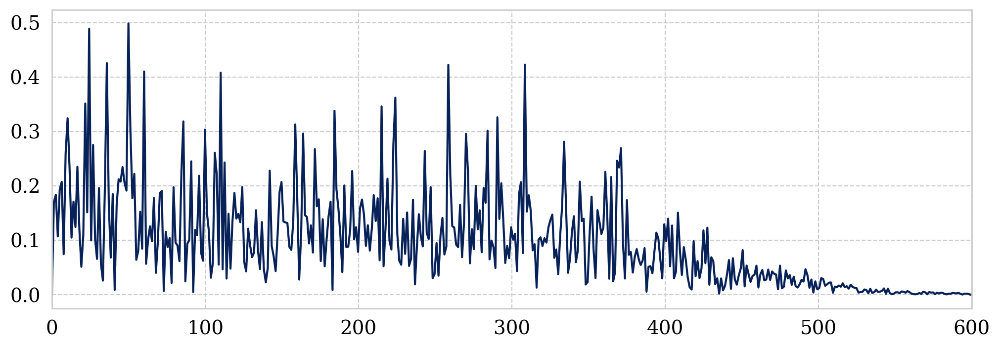

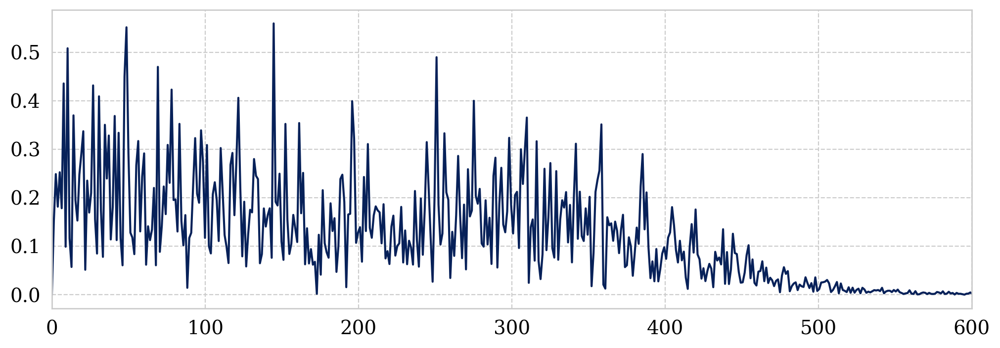

KeyboardInterrupt: 

In [41]:
fft_feats = []

for i in range(len(vib_9500_10000)):
    fft_obj = envelope.perform_fft(vib_9500_10000[i][0:20000],times_wt4[i])
    plt.plot(fft_obj['freq'], fft_obj['fft_norm'])
    plt.xlim(0,600)
    plt.show()
#print(fft_feats.shape())
#fft_df = pd.DataFrame(fft_feats,columns=np.arange(0,len(peak_vals)))

## Time-frequency domain Spectrogram: Inspect the energy levels over time

(0, 8)

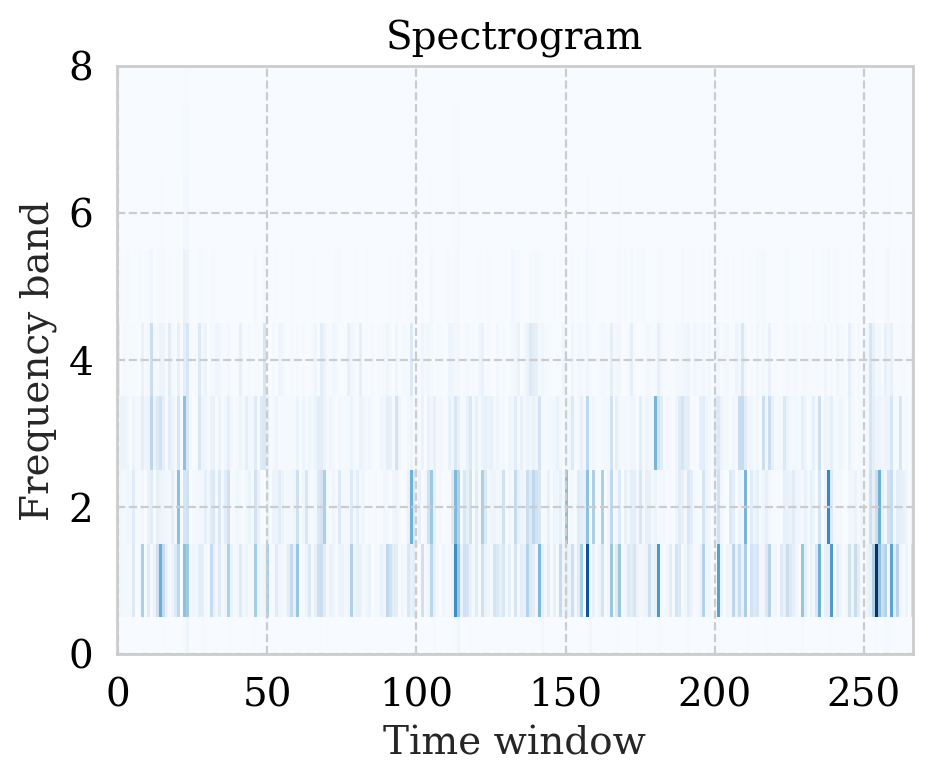

In [66]:
from scipy import signal
freqs, times, spectrogram = signal.spectrogram(vib_9500_10000[2][0:60000])

plt.figure(figsize=(5, 4))
plt.imshow(spectrogram, aspect='auto', cmap='Blues', origin='lower')
plt.title('Spectrogram')
plt.ylabel('Frequency band')
plt.xlabel('Time window')
plt.tight_layout()
plt.ylim(0,8)


array([1.85556825e-05, 9.93041208e-05, 8.33831424e-05, 4.11720888e-05,
       1.56964766e-05, 3.13103391e-06, 1.94365549e-07, 4.41562989e-09,
       4.51088716e-10, 1.35778218e-10, 5.54234661e-11, 2.64900049e-11,
       1.39918205e-11, 7.93761149e-12, 4.76830257e-12, 3.01733061e-12,
       2.02673517e-12, 1.47298053e-12, 1.16836612e-12, 9.80407264e-13,
       8.19189247e-13, 6.51495085e-13, 4.88771136e-13, 3.51801842e-13,
       2.49006579e-13, 1.76928008e-13, 1.27786166e-13, 9.43085014e-14,
       7.11589568e-14, 5.47933760e-14, 4.29439983e-14, 3.41671011e-14,
       2.75323146e-14, 2.24274898e-14, 1.84399774e-14, 1.52846835e-14,
       1.27600026e-14, 1.07203206e-14, 9.05847072e-15, 7.69427089e-15,
       6.56685920e-15, 5.62945327e-15, 4.84569342e-15, 4.18704319e-15,
       3.63091037e-15, 3.15926870e-15, 2.75763307e-15, 2.41428900e-15,
       2.11970681e-15, 1.86609243e-15, 1.64703947e-15, 1.45726901e-15,
       1.29241451e-15, 1.14890414e-15, 1.02390290e-15, 9.25473694e-16,
      

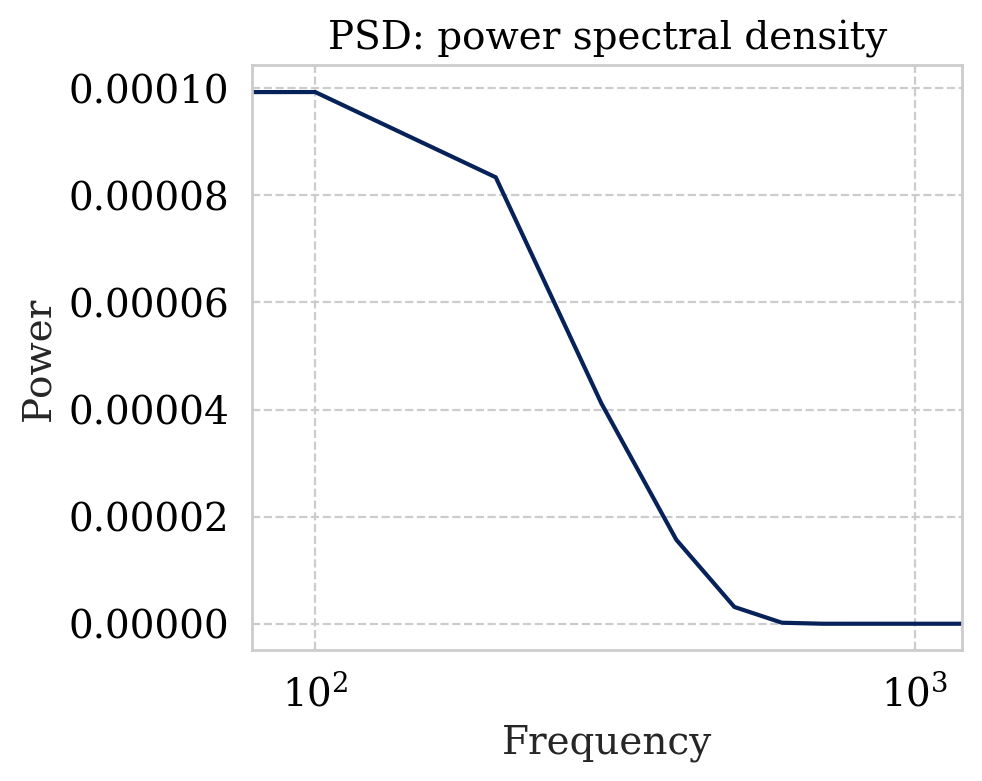

In [82]:
def get_psd(sig,fs ):
    freqs, psd = signal.welch(sig, fs=fs)
    plt.figure(figsize=(5, 4))
    plt.semilogx(freqs, psd)
    plt.title('PSD: power spectral density')
    plt.xlabel('Frequency')
    plt.ylabel('Power')
    plt.tight_layout()
    plt.xlim(0,1200)
    return psd

# psd = get_psd(vib_9500_10000[0][0:20000])

get_psd( vib_9500_10000[0][0:60000],fs)


In [234]:
def get_shorter_signal_info(sig,times):
    signal_shorter =  sig[0:60000]
    t_n = len(times[0:60000]) # Duration of signal in s
    N = len(signal_shorter)
    T = times[0:60000][1] - times[0:60000][0] # Time between each sample in signal in s
    f_s = 1/T
    return f_s, N, T

f_s, N, T = get_shorter_signal_info(vib_9500_10000[0],times_wt4[0])
print(f_s)
f_values, psd_values = get_psd_values(vib_9500_10000[0][0:60000], T, N, f_s)


25600.0


60000
3.90625e-05


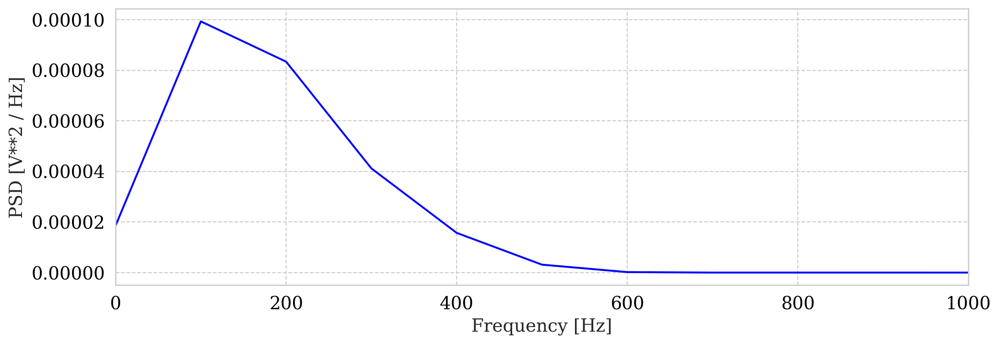

In [84]:
signal_shorter =  vib_9500_10000[0]


def get_psd_values(y_values, T, N, f_s):
    f_values, psd_values = signal.welch(y_values, fs=f_s)
    return f_values, psd_values


f_s, N, T = get_shorter_signal_info(vib_9500_10000[0],times_wt4[0])

print(N)
print(T)
f_values, psd_values = get_psd_values(vib_9500_10000[0][0:60000], T, N, f_s)

plt.plot(f_values, psd_values, linestyle='-', color='blue')
plt.xlabel('Frequency [Hz]')
plt.ylabel('PSD [V**2 / Hz]')
plt.xlim(0,1000)
plt.show()

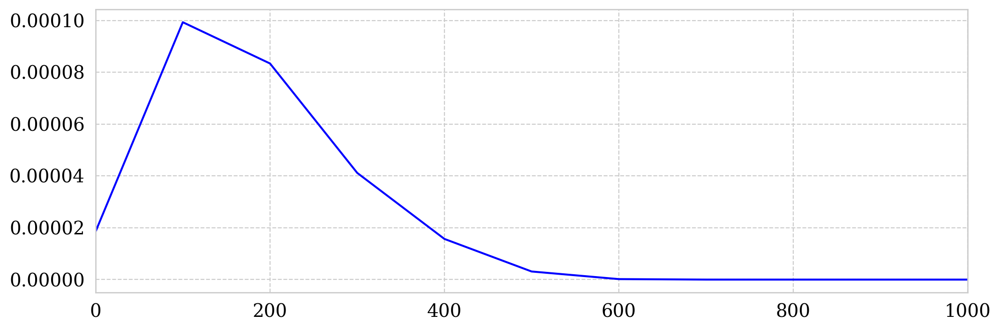

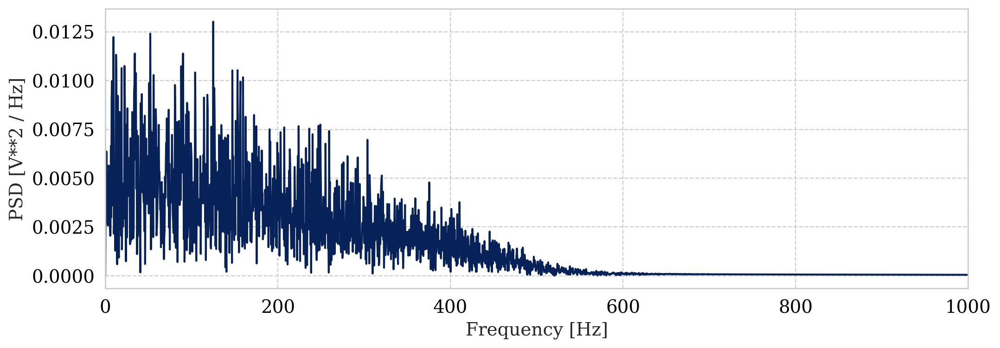

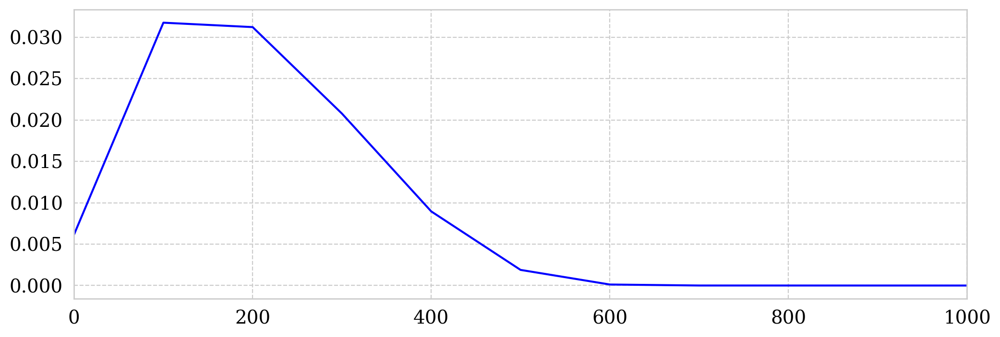

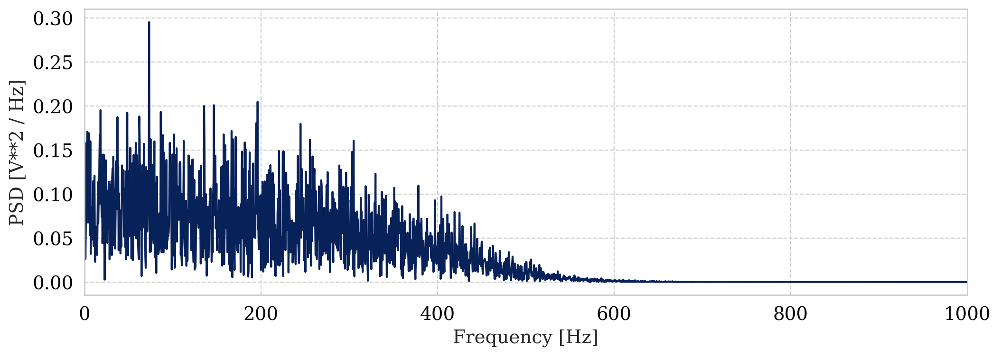

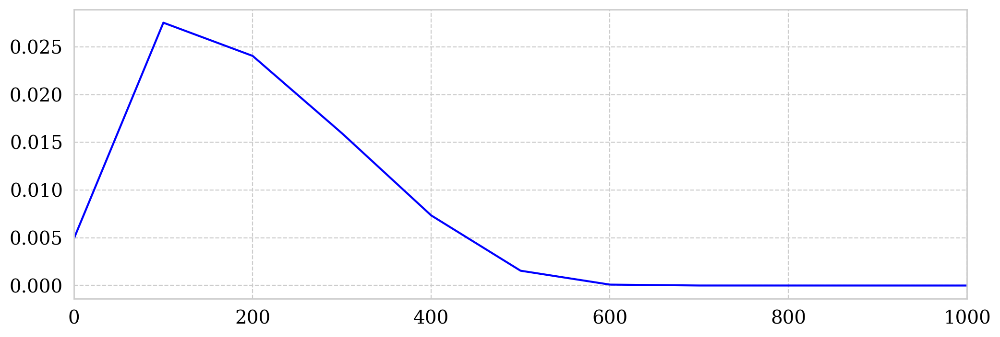

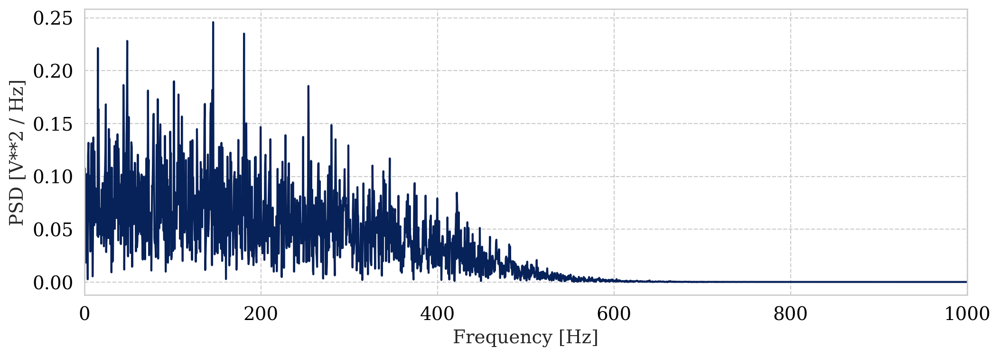

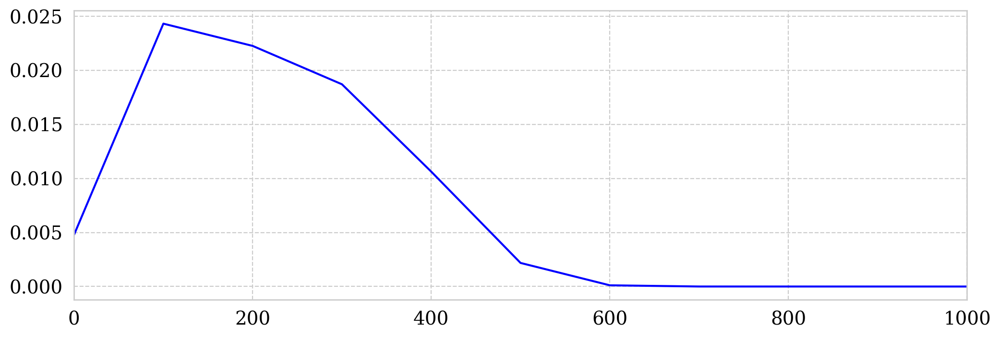

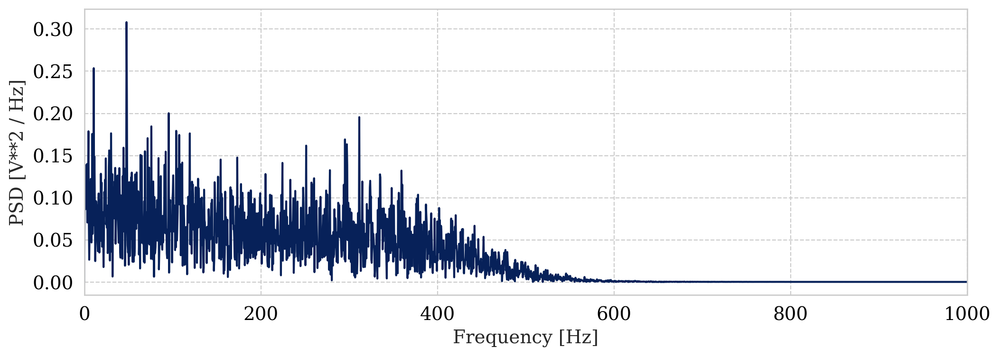

KeyboardInterrupt: 

In [233]:
def split(a, n):
    k, m = divmod(len(a), n)
    return (a[i * k + min(i, m):(i + 1) * k + min(i + 1, m)] for i in range(n))

def get_psd_values(y_values, T, N, f_s):
    f_values, psd_values = signal.welch(y_values, fs=f_s)
    return f_values, psd_values

# Takes in all vibration signals and gives back features in the frequency domain
def get_feaure_df(vibs,times):
    freq_features = []

    for j, sig in enumerate(vibs):
        
        f_s, N, T = get_shorter_signal_info(sig, times[j])

        f_values, psd_values = get_psd_values(sig[0:60000], T, N, f_s)

        plt.plot(f_values, psd_values, linestyle='-', color='blue')
        plt.xlim(0,1000)

        plt.show()

        fft_obj = envelope.perform_fft(sig[0:60000], times[j][0:60000])
        plt.plot(fft_obj['freq'], fft_obj['fft_norm'])

        plt.xlabel('Frequency [Hz]')
        plt.ylabel('PSD [V**2 / Hz]')
        plt.xlim(0,1000)
        plt.show()
        
        # splitting the frequencies into 40 bins
        chunks=np.array_split(range(len(f_values)), 40)
        
        np.array_split(range(10), 3)
        freq_bins = []
        psd_means = []
        for c in chunks:
            vals = []
            for index in c:
                vals.append(psd_values[index])
            psd_means.append(np.mean(vals))
            # print(len(freq_features))
        freq_features.append(psd_means)  
    
    # setting up the feaure df        
    columns = np.arange(0,40)
    columns = [f"psd_({i})" for i in range(40)]
    return pd.DataFrame(freq_features, columns=columns)
                
freq_df = get_feaure_df(vib_9500_10000, times_wt4)

In [232]:
freq_df.iloc[:,3]

0      7.428795e-12
1      3.122107e-09
2      2.180913e-09
3      2.718340e-09
4      1.193913e-09
           ...     
419    2.519973e-09
420    5.743673e-09
421    5.004245e-09
422    2.294301e-12
423    3.947682e-09
Name: psd_(3), Length: 424, dtype: float64

In [151]:
# Adding columns from freq_df to df
print(df.shape)
print(freq_df.shape)
result = pd.concat([df, freq_df], axis=1, sort=False)
result.shape

(424, 10)
(424, 40)


(424, 50)

In [154]:
result

,rms,kurt,skewness,energy_mean,signal_mean,AvgPower,ActPower,WindSpeed,NacelleDirection,AvgSpeed,...,psd_(30),psd_(31),psd_(32),psd_(33),psd_(34),psd_(35),psd_(36),psd_(37),psd_(38),psd_(39)
0,693.322446,6.187482,1.988215,3200.012223,0.682194,487.811127,387.100006,5.7,236.699997,1000.724591,...,1.433347e-17,1.070631e-17,7.837464e-18,5.576892e-18,3.811005e-18,2.454168e-18,1.442571e-18,7.298415e-19,2.839550e-19,7.462330e-20
1,4349.243843,6.308812,2.080912,3200.012847,4.162867,2697.461426,2332.100098,9.1,256.100006,1456.464986,...,5.108533e-15,3.814278e-15,2.790631e-15,1.984047e-15,1.353984e-15,8.698801e-16,5.089609e-16,2.546760e-16,9.559614e-17,2.186468e-17
2,4855.125348,5.595298,1.988628,3200.013003,4.715489,2606.151855,2843.500000,10.0,240.199997,1468.503663,...,3.563487e-15,2.661418e-15,1.947942e-15,1.385746e-15,9.465793e-16,6.091435e-16,3.575682e-16,1.803194e-16,6.943238e-17,1.757134e-17
3,4634.438343,6.186374,2.082814,3200.012930,4.466649,2541.849854,2694.100098,10.5,71.099998,1458.875183,...,4.356323e-15,3.252922e-15,2.380244e-15,1.692628e-15,1.155505e-15,7.428160e-16,4.351426e-16,2.183735e-16,8.276420e-17,1.969913e-17
4,4387.911288,6.046927,2.093197,3200.012872,4.183909,2853.304199,3293.399902,12.7,269.399994,1460.635409,...,1.906470e-15,1.424960e-15,1.044181e-15,7.441819e-16,5.098614e-16,3.298375e-16,1.956309e-16,1.010805e-16,4.193193e-17,1.345312e-17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
419,3377.541894,4.375476,1.789259,3200.012560,3.349608,2565.862793,1585.199951,7.7,358.799988,1420.395518,...,4.052229e-15,3.028543e-15,2.219041e-15,1.581288e-15,1.083172e-15,7.004885e-16,4.152055e-16,2.142225e-16,8.849358e-17,2.806443e-17
420,4332.355482,5.279254,1.903630,3200.012817,4.300772,2891.829346,2819.300049,10.4,318.600006,1487.214505,...,9.269059e-15,6.921039e-15,5.063988e-15,3.600744e-15,2.457748e-15,1.579545e-15,9.248155e-16,4.635302e-16,1.749531e-16,4.094527e-17
421,4648.959074,4.572177,1.809813,3200.012867,4.621687,2581.525879,3160.600098,10.2,317.000000,1489.520070,...,8.271809e-15,6.176549e-15,4.519354e-15,3.213549e-15,2.193509e-15,1.409762e-15,8.254429e-16,4.137592e-16,1.562103e-16,3.659925e-17
422,321.170802,6.291017,2.070746,3200.012210,0.310700,459.051758,401.200012,5.4,267.000000,887.233392,...,3.711343e-18,2.771758e-18,2.028622e-18,1.443063e-18,9.856511e-19,6.342005e-19,3.721785e-19,1.875708e-19,7.208049e-20,1.810570e-20


In [156]:
result

,rms,kurt,skewness,energy_mean,signal_mean,AvgPower,ActPower,WindSpeed,NacelleDirection,AvgSpeed,...,psd_(30),psd_(31),psd_(32),psd_(33),psd_(34),psd_(35),psd_(36),psd_(37),psd_(38),psd_(39)
0,693.322446,6.187482,1.988215,3200.012223,0.682194,487.811127,387.100006,5.7,236.699997,1000.724591,...,1.433347e-17,1.070631e-17,7.837464e-18,5.576892e-18,3.811005e-18,2.454168e-18,1.442571e-18,7.298415e-19,2.839550e-19,7.462330e-20
1,4349.243843,6.308812,2.080912,3200.012847,4.162867,2697.461426,2332.100098,9.1,256.100006,1456.464986,...,5.108533e-15,3.814278e-15,2.790631e-15,1.984047e-15,1.353984e-15,8.698801e-16,5.089609e-16,2.546760e-16,9.559614e-17,2.186468e-17
2,4855.125348,5.595298,1.988628,3200.013003,4.715489,2606.151855,2843.500000,10.0,240.199997,1468.503663,...,3.563487e-15,2.661418e-15,1.947942e-15,1.385746e-15,9.465793e-16,6.091435e-16,3.575682e-16,1.803194e-16,6.943238e-17,1.757134e-17
3,4634.438343,6.186374,2.082814,3200.012930,4.466649,2541.849854,2694.100098,10.5,71.099998,1458.875183,...,4.356323e-15,3.252922e-15,2.380244e-15,1.692628e-15,1.155505e-15,7.428160e-16,4.351426e-16,2.183735e-16,8.276420e-17,1.969913e-17
4,4387.911288,6.046927,2.093197,3200.012872,4.183909,2853.304199,3293.399902,12.7,269.399994,1460.635409,...,1.906470e-15,1.424960e-15,1.044181e-15,7.441819e-16,5.098614e-16,3.298375e-16,1.956309e-16,1.010805e-16,4.193193e-17,1.345312e-17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
419,3377.541894,4.375476,1.789259,3200.012560,3.349608,2565.862793,1585.199951,7.7,358.799988,1420.395518,...,4.052229e-15,3.028543e-15,2.219041e-15,1.581288e-15,1.083172e-15,7.004885e-16,4.152055e-16,2.142225e-16,8.849358e-17,2.806443e-17
420,4332.355482,5.279254,1.903630,3200.012817,4.300772,2891.829346,2819.300049,10.4,318.600006,1487.214505,...,9.269059e-15,6.921039e-15,5.063988e-15,3.600744e-15,2.457748e-15,1.579545e-15,9.248155e-16,4.635302e-16,1.749531e-16,4.094527e-17
421,4648.959074,4.572177,1.809813,3200.012867,4.621687,2581.525879,3160.600098,10.2,317.000000,1489.520070,...,8.271809e-15,6.176549e-15,4.519354e-15,3.213549e-15,2.193509e-15,1.409762e-15,8.254429e-16,4.137592e-16,1.562103e-16,3.659925e-17
422,321.170802,6.291017,2.070746,3200.012210,0.310700,459.051758,401.200012,5.4,267.000000,887.233392,...,3.711343e-18,2.771758e-18,2.028622e-18,1.443063e-18,9.856511e-19,6.342005e-19,3.721785e-19,1.875708e-19,7.208049e-20,1.810570e-20


In [220]:
result1 = result.drop(['rms','kurt','skewness','energy_mean','NacelleDirection','signal_mean','psd_(5)', 'psd_(6)', 'psd_(7)', 'psd_(8)', 'psd_(9)', 'psd_(10)', 'psd_(11)', 'psd_(12)', 'psd_(13)', 'psd_(14)', 'psd_(15)', 'psd_(16)', 'psd_(17)', 'psd_(18)', 'psd_(19)', 'psd_(20)', 'psd_(21)', 'psd_(22)', 'psd_(23)', 'psd_(24)', 'psd_(25)', 'psd_(26)', 'psd_(27)', 'psd_(28)', 'psd_(29)', 'psd_(30)', 'psd_(31)', 'psd_(32)', 'psd_(33)', 'psd_(34)', 'psd_(35)', 'psd_(36)', 'psd_(37)', 'psd_(38)', 'psd_(39)'],axis=1)


#result.drop(['kurt'])
#result.drop(['skewness'])
#result.drop(['energy_mean'])
#result.drop(['NacelleDirection'])
result1



,AvgPower,ActPower,WindSpeed,AvgSpeed,psd_(0),psd_(1),psd_(2),psd_(3),psd_(4)
0,487.811127,387.100006,5.7,1000.724591,0.000061,0.000005,1.671957e-10,7.428795e-12,1.412128e-12
1,2697.461426,2332.100098,9.1,1456.464986,0.022476,0.002742,8.876195e-08,3.122107e-09,4.729668e-10
2,2606.151855,2843.500000,10.0,1468.503663,0.018119,0.002248,6.574090e-08,2.180913e-09,3.298770e-10
3,2541.849854,2694.100098,10.5,1458.875183,0.017525,0.003232,8.182075e-08,2.718340e-09,4.152778e-10
4,2853.304199,3293.399902,12.7,1460.635409,0.009622,0.001358,3.645816e-08,1.193913e-09,2.025537e-10
...,...,...,...,...,...,...,...,...,...
419,2565.862793,1585.199951,7.7,1420.395518,0.021191,0.002417,7.278883e-08,2.519973e-09,4.303639e-10
420,2891.829346,2819.300049,10.4,1487.214505,0.041540,0.006098,1.535275e-07,5.743673e-09,8.658917e-10
421,2581.525879,3160.600098,10.2,1489.520070,0.040677,0.004954,1.405303e-07,5.004245e-09,7.759263e-10
422,459.051758,401.200012,5.4,887.233392,0.000016,0.000002,6.576666e-11,2.294301e-12,3.451833e-13


In [221]:
df.index.values

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [222]:
res = scale_df(result1)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


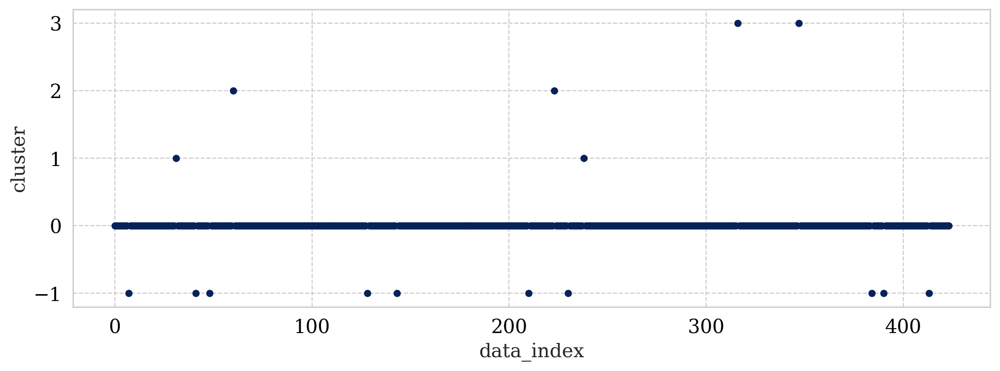

<BarContainer object of 5 artists>

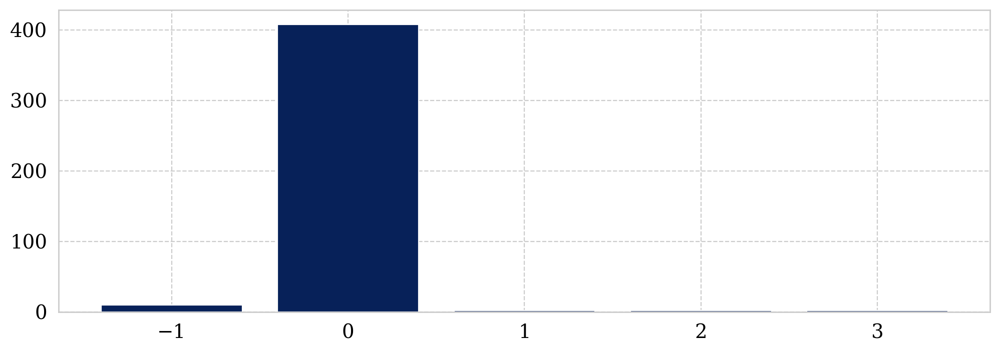

In [225]:

# Cluster it 
# df_short = df_short.drop(['NacelleDirection'],axis=1)

clustering = DBSCAN(eps=0.20, min_samples=2).fit(res)
cluster_map = pd.DataFrame()
cluster_map['data_index'] = result.index.values
cluster_map['cluster'] = clustering.labels_
cluster_map.plot.scatter(y='cluster', x='data_index')
plt.show()
plt.bar(cluster_map['cluster'].value_counts().keys(), cluster_map['cluster'].value_counts().values)

In [209]:
res.shape

(424, 44)

In [211]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(res)
principalDf = pd.DataFrame(data = principalComponents
             , columns = [f"{i}" for i in (range(3))])

In [212]:
principalDf

,0,1,2
0,-0.892956,0.430103,-0.037156
1,0.061436,-0.119338,0.070259
2,-0.074919,-0.241413,-0.018409
3,-0.004763,-0.165938,-0.019786
4,-0.181824,-0.442843,-0.077592
...,...,...,...
419,-0.078799,-0.030072,0.169036
420,0.555072,-0.007471,0.008682
421,0.430752,-0.027169,-0.079353
422,-0.908904,0.452164,-0.062023


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


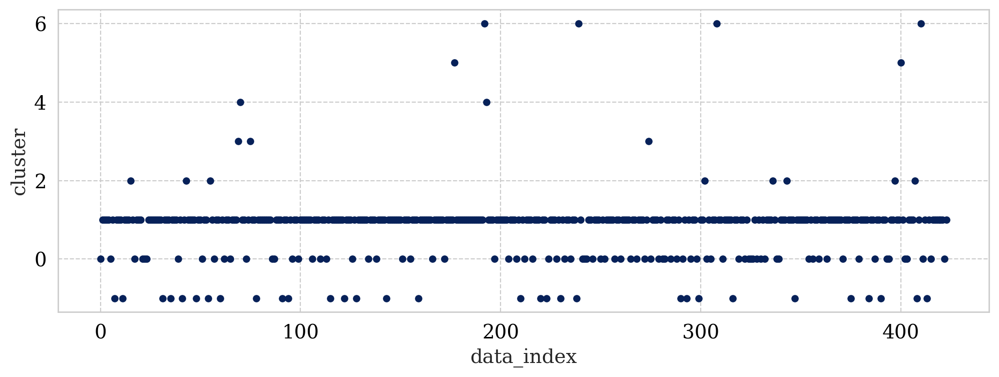

<BarContainer object of 8 artists>

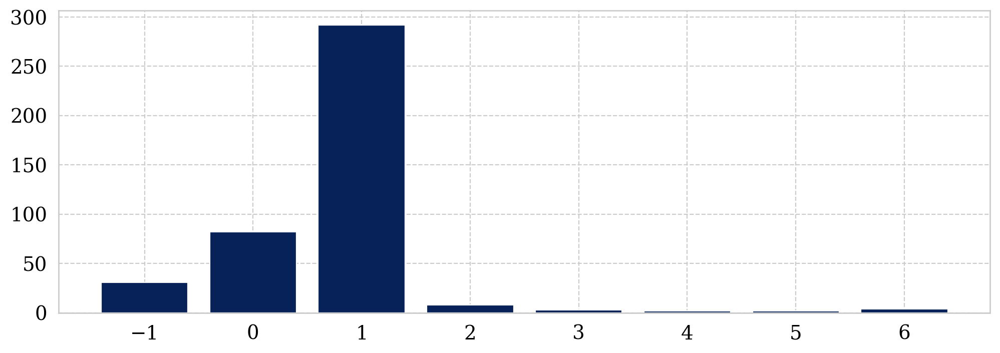

In [218]:

# Cluster it 
# df_short = df_short.drop(['NacelleDirection'],axis=1)

clustering = DBSCAN(eps=0.10, min_samples=2).fit(principalDf)
cluster_map = pd.DataFrame()
cluster_map['data_index'] = result.index.values
cluster_map['cluster'] = clustering.labels_
cluster_map.plot.scatter(y='cluster', x='data_index')
plt.show()
plt.bar(cluster_map['cluster'].value_counts().keys(), cluster_map['cluster'].value_counts().values)